#### Similarity analysis

In [2]:
import os
import random
import numpy as np
import pandas as pd
import pickle 

from sklearn import metrics
from sklearn.metrics.pairwise import cosine_similarity

from gensim.models import Word2Vec
import networkx as nx

import pubchempy as pcp
from rdkit.Chem import PandasTools

from IPython.display import HTML
import matplotlib.pyplot as plt

# suppress all warnings
import warnings
warnings.filterwarnings('ignore') 

SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
# seed the global RNG 
random.seed(SEED)
# seed the global NumPy RNG
np.random.seed(SEED)

In [53]:
def find_most_similar(model, id, n, threshold=0.9):
    """
    this function computes the most similar molecules given a similarity threshold
    :param model: Node2Vec model 
    :param id: string representing molecule cid
    :param n: number of top molecules to be considered
    :param threshold: similarity value  
    :param seed: seed for reproducibility 
    :return: list of similar molecules
    """
    res = [item for item in model.wv.most_similar(id, topn=n) if item[1] > threshold]
    # at least 2 similar molecules
    while (len(res) < 2 and threshold > 0.75):  
        # decrease similarity threshold
        threshold-=0.01  
        res = [item for item in model.wv.most_similar(id, topn=n) if item[1] > threshold]
    return res

In [3]:
def getmol(cid):
  """
  this function returns the isomeric smiles corresponding to the input cid
  :cid: integer representing molecule cid
  :return: string representing the isomeric smiles of the input molecule
  """
  temp = pcp.Compound.from_cid(cid)
  return temp.isomeric_smiles

In [79]:
# load molecules table 
path_read = '../Flask/psql_db/Tables'
molecules = pd.read_csv(path_read + '/MoleculesTable.csv', encoding='latin1')
molecules.head()

,Chemical_Name,CID,CAS,InChIKey,Canonical_SMILES,Molecular_Formula,Atoms,Molecule_Type
0,(1-methylpropyl)benzene,8680,135-98-8,ZJMWRROPUADPEA-UHFFFAOYSA-N,CCC(C)C1=CC=CC=C1,C10H14,[C],organic
1,(2-methylbutyl)cyclohexane,143127,54105-77-0,DDQXBDLAGHZBMP-UHFFFAOYSA-N,CCC(C)CC1CCCCC1,C11H22,[C],organic
2,(2-methylpropyl)benzene,10870,538-93-2,KXUHSQYYJYAXGZ-UHFFFAOYSA-N,CC(C)CC1=CC=CC=C1,C10H14,[C],organic
3,"1,1,1-trichloroethane",6278,71-55-6,UOCLXMDMGBRAIB-UHFFFAOYSA-N,CC(Cl)(Cl)Cl,C2H3Cl3,"[C, Cl]",organic
4,"1,1,2,2-tetrachloroethane",6591,79-34-5,QPFMBZIOSGYJDE-UHFFFAOYSA-N,C(C(Cl)Cl)(Cl)Cl,C2H2Cl4,"[C, Cl]",organic


In [67]:
# define models path name
path = "../Embedding_models/"
models = ['FPBitsEmbedding',
        'FPCountsEmbedding',
        'MolDescEmbedding',
        'QuantumPropsEmbedding']
pnames = [path + p for p in models]

##### Phosgene - case study

In [55]:
# phosgene in FP bits space
cid = '6371'
model = Word2Vec.load(pnames[0])
# output most similar molecules
molecules[['CID', 'Chemical_Name', 'Molecular_Formula', 'Canonical_SMILES']][molecules['CID'].isin([(int(x)) for x in list(zip(*find_most_similar(model, cid, len(molecules), threshold=0.95)))[0]])]

,CID,Chemical_Name,Molecular_Formula,Canonical_SMILES
3,6278,"1,1,1-trichloroethane",C2H3Cl3,CC(Cl)(Cl)Cl
279,5943,Carbon tetrachloride,CCl4,C(Cl)(Cl)(Cl)Cl
287,6212,Chloroform,CHCl3,C(Cl)(Cl)Cl
327,6344,Dichloromethane,CH2Cl2,C(Cl)Cl
1104,6214,Hexachloroethane,C2Cl6,C(C(Cl)(Cl)Cl)(Cl)(Cl)Cl
1190,6419,Pentachloroethane,C2HCl5,C(C(Cl)(Cl)Cl)(Cl)Cl
1808,24193,Titanium tetrachloride,Cl4Ti,Cl[Ti](Cl)(Cl)Cl


In [56]:
# read FP bits preprocessed object
filename = '../Preprocessed_data/fp_bits.obj'
filehandler = open(filename, 'rb') 
Fpb_obj = pickle.load(filehandler)
Fpb_obj

{'annotation': {'samples': Int64Index([   8680,  143127,   10870,   69848,   12993,  164514,   86240,
                13129,   67884,    6278,
              ...
                 1117,    1119,   24682, 4685067,   14778,   24841,   14781,
                11430,   26042,   24193],
             dtype='int64', length=1750),
  'features': Index(['FP1', 'FP2', 'FP3', 'FP4', 'FP5', 'FP6', 'FP7', 'FP8', 'FP9', 'FP10',
         ...
         'AD2D714', 'AD2D715', 'AD2D726', 'AD2D729', 'AD2D735', 'AD2D760',
         'AD2D765', 'AD2D766', 'AD2D770', 'AD2D780'],
        dtype='object', length=5218)},
 'tfidf': {'tfidf_transformer': TfidfTransformer(),
  'tfidf_data': <1750x5218 sparse matrix of type '<class 'numpy.float64'>'
  	with 467820 stored elements in Compressed Sparse Row format>},
 'lsa': {'lsa_data': array([[ 4.46150378e-01,  4.65599796e-01, -2.30471042e-01, ...,
           1.78108040e-02, -4.14571861e-03,  3.34084720e-02],
         [ 7.61418679e-01, -2.97931919e-01, -2.92913529e-01, ...,

In [57]:
# original cosine similarity between 6371 and 6278
Fpb_obj['net']['network'][(Fpb_obj['net']['network'].Target == 6371) & (Fpb_obj['net']['network'].Source == 6278)]

,Source,Target,Similarity,Pvalue,-Log10Pvalue
17431,6278,6371,0.842683,0.002,2.69897


In [58]:
# cosine similarity between correpsonding vectors in the embedding space
cosine_similarity(model.wv['6371'].reshape(1, -1), model.wv['6278'].reshape(1, -1) )

array([[0.982443]], dtype=float32)

In [59]:
# find most similar with similarity threshold of 0.98
find_most_similar(model, cid, len(molecules), threshold=0.98)

[('5943', 0.9890647530555725),
 ('6212', 0.9884665608406067),
 ('6278', 0.9824429750442505)]

##### Similarities of organic and inorganic molecules
| CID | Chemical_Name | Molecule_Type |
| --- | --- | --- | 
| 6371 | Phosgene | inorganic |
| 14781 | Hydroxyapatite | inorganic |
| 1119 | Sulfur dioxide | inorganic |
| 145068 | Nitric Oxide | inorganic |
| 223 | Ammonium | inorganic |
| 6347 | Isocyanic acid | inorganic |
| 136332 | Carbon suboxide | inorganic | 
| 32881 | 2-(2-hydroxypropoxy)propan-1-ol | organic |
| 70155 | 1-Methyl-4-nitronaphthalene | organic |
| 39929 | 2,3,7,8-Tetrachlorodibenzofuran | organic |
| 6838 | N-Nitroso-N-diphenylamine | organic |
| 76004 | Vinyltrimethoxysilane | organic |
| 887 | Methanol | organic |
| 7378 | 1-(1,1-dimethylethyl)-3,5-dimethylbenzene | organic | 
| 9997 | 1,3-Butadiyne | organic |
| 768 | Hydrogen Cyanide | organic

In [61]:
# list of cids
inorganic = ['6371', '14781', '1119', '145068', '223','6347','136332']
organic = ['32881', '70155', '39929', '6838', '76004', '887', '7378','9997','768']

In [68]:
# return most similar molecules for each space given a threshold
for PATH in pnames:
  model = Word2Vec.load(PATH)
  print(PATH.split('/')[2])
  df_inorganic = []
  df_organic = []
  # similar to inorganic molecules
  for cid in inorganic:
    # check if key is present
    try:
      df = pd.DataFrame(find_most_similar(model, cid, len(molecules), threshold=0.96))     
    except KeyError:
      continue

    # set columns
    df.columns=['similar_cid','measure']
    df['type'] = 'inorganic'
    df['model'] = PATH.split('/')[2]
    df['orig_cid'] = cid
    df_inorganic.append(df)

  # similar to organic molecules
  for cid in organic:
    try:
      # check if key is present
      df = pd.DataFrame(find_most_similar(model, cid, len(molecules), threshold=0.96))     
    except KeyError:
      continue

    # set columns
    df.columns=['similar_cid','measure']
    df['type'] = 'organic'
    df['model'] = PATH.split('/')[2]
    df['orig_cid'] = cid
    df_organic.append(df)

  df_inorganic = pd.concat(df_inorganic)
  df_organic = pd.concat(df_organic)

  # generate output dataframe
  df_all = [df_inorganic, df_organic]
  df_all = pd.concat(df_all)
  # save results
  df_all.to_csv('../Similar_molecules/'+'topsimilar_'+PATH.split('/')[2]+'.tsv',sep="\t", index=False)

FPBitsEmbedding
FPCountsEmbedding
MolDescEmbedding
QuantumPropsEmbedding


##### Analyse single elements
| CID | Chemical_Name |
| --- | --- |
| 24526 | Chlorine |
| 5352425 | Lead |
| 6327182 | Tellurium |
| 935 | Nickel |
| 5462309 | Phosphorus|
| 23963 | Titanium |
| 23989 | Uranium | 
| 23980 | Erbium |

In [69]:
# define models path name
path = "../Embedding_models/"
models = ['MolDescElemEmbedding', 
         'QuantumPropsElemEmbedding']
pnames = [path + p for p in models]

In [70]:
# list of cids
elements = ['24526', '5352425', '6327182', '935', '5462309', '23963', '23989', '23980']

In [71]:
# return most similar molecules
for PATH in pnames:
  model = Word2Vec.load(PATH)
  print(PATH.split('/')[2])
  df_elements = []
  # similar to single elements
  for cid in elements:
    try:
      df = pd.DataFrame(find_most_similar(model, cid, len(molecules), threshold=0.98))     
    except KeyError:
      continue
  
    # add columns
    df.columns=['similar_cid','measure']
    df['type'] = 'inorganic'
    df['model'] = PATH.split('/')[2]
    df['orig_cid'] = cid
    df_elements.append(df)

  df_elements = pd.concat(df_elements)
  # save results
  df_elements.to_csv('../Similar_molecules/'+'/topsimilar_'+PATH.split('/')[2]+'.tsv',sep="\t", index=False)

MolDescElemEmbedding
QuantumPropsElemEmbedding


#### FP bits space

In [119]:
# load computed similar molecules
fpb = pd.read_csv('../Similar_molecules/topsimilar_FPBitsEmbedding.tsv',sep='\t')
fpb.head()

,similar_cid,measure,type,model,orig_cid
0,5943,0.989065,inorganic,FPBitsEmbedding,6371
1,6212,0.988467,inorganic,FPBitsEmbedding,6371
2,6278,0.982443,inorganic,FPBitsEmbedding,6371
3,6214,0.975656,inorganic,FPBitsEmbedding,6371
4,6344,0.967288,inorganic,FPBitsEmbedding,6371


In [73]:
# add isomeric SMILES to df
fpb['similar_SMILES'] = [getmol(cid) for cid in fpb['similar_cid']]
fpb['orig_SMILES'] = [getmol(cid) for cid in fpb['orig_cid']]

In [74]:
# add molecule structure figure
PandasTools.AddMoleculeColumnToFrame(fpb, smilesCol='similar_SMILES', molCol="similar_molecule")
PandasTools.AddMoleculeColumnToFrame(fpb, smilesCol='orig_SMILES', molCol="orig_molecule")

,similar_cid,measure,type,model,orig_cid,similar_SMILES,orig_SMILES,similar_molecule,orig_molecule
0,5943,0.989065,inorganic,FPBitsEmbedding,6371,C(Cl)(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
1,6212,0.988467,inorganic,FPBitsEmbedding,6371,C(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
2,6278,0.982443,inorganic,FPBitsEmbedding,6371,CC(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
3,6214,0.975656,inorganic,FPBitsEmbedding,6371,C(C(Cl)(Cl)Cl)(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
4,6344,0.967288,inorganic,FPBitsEmbedding,6371,C(Cl)Cl,C(=O)(Cl)Cl,,
5,3681305,0.975926,inorganic,FPBitsEmbedding,14781,OP(=O)([O-])[O-],[OH-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[Ca+2].[Ca+2].[Ca+2].[Ca+2].[Ca+2],,
6,1061,0.974291,inorganic,FPBitsEmbedding,14781,[O-]P(=O)([O-])[O-],[OH-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[Ca+2].[Ca+2].[Ca+2].[Ca+2].[Ca+2],,
7,3039,0.962777,inorganic,FPBitsEmbedding,14781,COP(=O)(OC)OC=C(Cl)Cl,[OH-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[Ca+2].[Ca+2].[Ca+2].[Ca+2].[Ca+2],,
8,24682,0.995152,inorganic,FPBitsEmbedding,1119,O=S(=O)=O,O=S=O,,
9,14264,0.991157,inorganic,FPBitsEmbedding,1119,C1COS(=O)(=O)C1,O=S=O,,

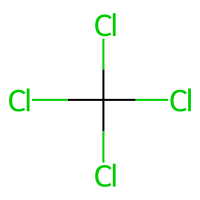
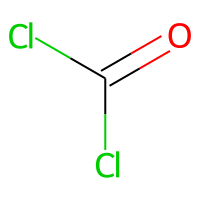
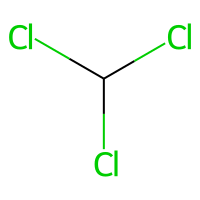
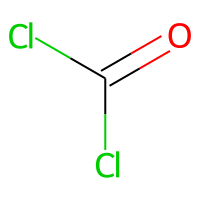
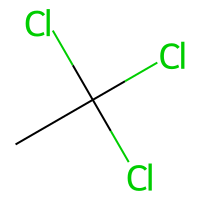
...
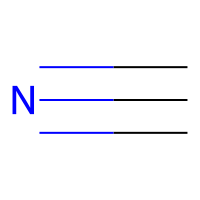
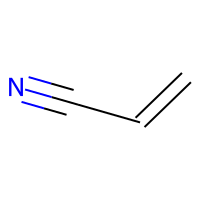
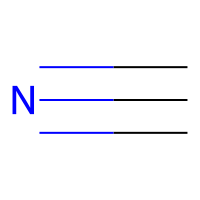
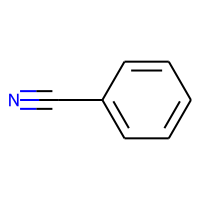
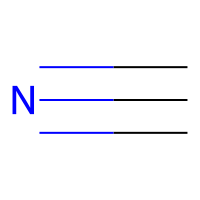

In [75]:
# display HTML
HTML(fpb.to_html())

In [76]:
# save to HTML
with open('../Similar_molecules/topsimilar_FPB.html','w') as f:
    f.write(fpb.to_html())

Identify common substructures

In [80]:
# load FP bits data 
fp_data = pd.read_csv(path_read + '/FingerprintsTable.csv', sep=',')
fp_data.drop(fp_data.iloc[:, 10145:fp_data.shape[1]], inplace=True, axis=1)
fp_data

,FP1,FP2,FP3,FP4,FP5,FP6,FP7,FP8,FP9,FP10,...,AD2D771,AD2D772,AD2D773,AD2D774,AD2D775,AD2D776,AD2D777,AD2D778,AD2D779,AD2D780
8680,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
143127,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10870,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
69848,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12993,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23990,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
23992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
23993,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
23994,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [86]:
# take the fingerprints of phosgene (different from 0)
orig_cid_fp = fp_data.columns[np.where(fp_data.loc[fpb.orig_cid[0]] != 0)]
orig_cid_fp 

Index(['FP239', 'FP513', 'FP555', 'FP603', 'FP742', 'FP743', 'FP744',
       'ExtFP121', 'ExtFP147', 'ExtFP350', 'ExtFP606', 'ExtFP631', 'ExtFP919',
       'ExtFP950', 'EStateFP16', 'EStateFP35', 'EStateFP54', 'GraphFP471',
       'GraphFP472', 'GraphFP742', 'GraphFP743', 'GraphFP744', 'GraphFP892',
       'GraphFP967', 'MACCSFP22', 'MACCSFP103', 'MACCSFP106', 'MACCSFP107',
       'MACCSFP134', 'MACCSFP154', 'MACCSFP164', 'PubchemFP18', 'PubchemFP37',
       'PubchemFP38', 'PubchemFP286', 'PubchemFP294', 'PubchemFP360',
       'PubchemFP420', 'PubchemFP444', 'SubFP143', 'SubFP295', 'SubFP307',
       'KRFP1193', 'KRFP2259', 'KRFP2975', 'KRFP3025', 'KRFP3749', 'KRFP3821',
       'KRFP3881', 'KRFP4331', 'AD2D3', 'AD2D7', 'AD2D12', 'AD2D106',
       'AD2D111', 'AD2D136', 'AD2D141', 'AD2D156'],
      dtype='object')

In [82]:
# take one similar molecule to phosgene
similar_cid = list(fpb[fpb.orig_cid == fpb.orig_cid[0]].similar_cid)
molecules[molecules.CID == similar_cid[0]]

,Chemical_Name,CID,CAS,InChIKey,Canonical_SMILES,Molecular_Formula,Atoms,Molecule_Type
279,Carbon tetrachloride,5943,56-23-5,VZGDMQKNWNREIO-UHFFFAOYSA-N,C(Cl)(Cl)(Cl)Cl,CCl4,"[C, Cl]",organic


In [84]:
# take fingerprints of carbon tetrachloride (different from 0)
sim_cid_fp = fp_data.columns[np.where(fp_data.loc[similar_cid[0]] != 0)]
sim_cid_fp 

Index(['FP513', 'FP603', 'FP743', 'FP744', 'ExtFP121', 'ExtFP631', 'ExtFP919',
       'ExtFP950', 'EStateFP19', 'EStateFP54', 'GraphFP471', 'GraphFP743',
       'GraphFP744', 'GraphFP892', 'MACCSFP22', 'MACCSFP103', 'MACCSFP106',
       'MACCSFP107', 'MACCSFP112', 'MACCSFP134', 'PubchemFP37', 'PubchemFP38',
       'PubchemFP39', 'PubchemFP294', 'PubchemFP360', 'SubFP8', 'SubFP307',
       'KRFP1154', 'KRFP1165', 'KRFP1532', 'KRFP2259', 'KRFP2975', 'KRFP3749',
       'KRFP3821', 'KRFP3834', 'KRFP3881', 'AD2D7', 'AD2D12', 'AD2D136',
       'AD2D141', 'AD2D156'],
      dtype='object')

In [87]:
# intersect common fingerprints/features 
# phosgene - 6371 and carbon tetrachloride - 5943
np.intersect1d(orig_cid_fp, sim_cid_fp)

# AP2D141	    AP2D2_Cl_X	Presence of Cl-X at topological distance 2
# AP2D156	    AP2D2_X_X	Presence of X-X at topological distance 2
# MACCSFP103    CL
# MACCSFP134    134 X (HALOGEN) 

array(['AD2D12', 'AD2D136', 'AD2D141', 'AD2D156', 'AD2D7', 'EStateFP54',
       'ExtFP121', 'ExtFP631', 'ExtFP919', 'ExtFP950', 'FP513', 'FP603',
       'FP743', 'FP744', 'GraphFP471', 'GraphFP743', 'GraphFP744',
       'GraphFP892', 'KRFP2259', 'KRFP2975', 'KRFP3749', 'KRFP3821',
       'KRFP3881', 'MACCSFP103', 'MACCSFP106', 'MACCSFP107', 'MACCSFP134',
       'MACCSFP22', 'PubchemFP294', 'PubchemFP360', 'PubchemFP37',
       'PubchemFP38', 'SubFP307'], dtype=object)

In [88]:
## store common fingerprint bits for each molecule
common_fp_bits = dict()
for i in np.unique(fpb.orig_cid):
    common_fp = dict()
    # get list of fingerprints
    orig_cid_fp = fp_data.columns[np.where(fp_data.loc[i] != 0)]
    similar_cid = fpb[fpb.orig_cid == i].similar_cid
    for j in similar_cid:
        # intersect lists of fingeprints
        common = np.intersect1d(orig_cid_fp, fp_data.columns[np.where(fp_data.loc[j] != 0)])
        common_fp.update({j : [common, len(common)]})
    common_fp_bits[i] = common_fp

common_fp_bits

{223: {6329: [array(['ExtFP425', 'ExtFP698', 'ExtFP713', 'ExtFP847', 'FP17', 'FP394',
          'FP742', 'GraphFP156', 'GraphFP742', 'GraphFP970', 'KRFP4080',
          'MACCSFP112', 'MACCSFP122', 'MACCSFP148', 'MACCSFP151',
          'MACCSFP161', 'MACCSFP22', 'MACCSFP49', 'PubchemFP0',
          'PubchemFP14', 'PubchemFP299', 'SubFP296', 'SubFP298', 'SubFP300',
          'SubFP301', 'SubFP307'], dtype=object),
   26],
  222: [array(['ExtFP425', 'ExtFP698', 'ExtFP713', 'ExtFP847', 'FP17', 'FP394',
          'FP742', 'GraphFP156', 'GraphFP742', 'GraphFP970', 'KRFP4080',
          'MACCSFP122', 'MACCSFP148', 'MACCSFP151', 'MACCSFP161',
          'MACCSFP22', 'PubchemFP14', 'PubchemFP299', 'SubFP300', 'SubFP301',
          'SubFP307'], dtype=object),
   21],
  674: [array(['ExtFP425', 'ExtFP698', 'ExtFP713', 'ExtFP847', 'FP17', 'FP394',
          'FP742', 'GraphFP156', 'GraphFP742', 'GraphFP970', 'KRFP4080',
          'MACCSFP112', 'MACCSFP122', 'MACCSFP148', 'MACCSFP151',
          'MAC

#### FP counts space

In [120]:
# load computed similar molecules
fpc = pd.read_csv('../Similar_molecules/topsimilar_FPCountsEmbedding.tsv',sep='\t')
fpc.head()

,similar_cid,measure,type,model,orig_cid
0,6214,0.978598,inorganic,FPCountsEmbedding,6371
1,6366,0.974469,inorganic,FPCountsEmbedding,6371
2,5943,0.973111,inorganic,FPCountsEmbedding,6371
3,6591,0.972953,inorganic,FPCountsEmbedding,6371
4,6423,0.972206,inorganic,FPCountsEmbedding,6371


In [90]:
# add isomeric SMILES to df
fpc['similar_SMILES'] = [getmol(cid) for cid in fpc['similar_cid']]
fpc['orig_SMILES'] = [getmol(cid) for cid in fpc['orig_cid']]

In [91]:
# add molecule structure figure
PandasTools.AddMoleculeColumnToFrame(fpc, smilesCol='similar_SMILES', molCol="similar_molecule")
PandasTools.AddMoleculeColumnToFrame(fpc, smilesCol='orig_SMILES', molCol="orig_molecule")

,similar_cid,measure,type,model,orig_cid,similar_SMILES,orig_SMILES,similar_molecule,orig_molecule
0,6214,0.978598,inorganic,FPCountsEmbedding,6371,C(C(Cl)(Cl)Cl)(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
1,6366,0.974469,inorganic,FPCountsEmbedding,6371,C=C(Cl)Cl,C(=O)(Cl)Cl,,
2,5943,0.973111,inorganic,FPCountsEmbedding,6371,C(Cl)(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
3,6591,0.972953,inorganic,FPCountsEmbedding,6371,C(C(Cl)Cl)(Cl)Cl,C(=O)(Cl)Cl,,
4,6423,0.972206,inorganic,FPCountsEmbedding,6371,C([N+](=O)[O-])(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
5,6278,0.970868,inorganic,FPCountsEmbedding,6371,CC(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
6,24193,0.969489,inorganic,FPCountsEmbedding,6371,Cl[Ti](Cl)(Cl)Cl,C(=O)(Cl)Cl,,
7,6344,0.968856,inorganic,FPCountsEmbedding,6371,C(Cl)Cl,C(=O)(Cl)Cl,,
8,6212,0.966576,inorganic,FPCountsEmbedding,6371,C(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
9,6575,0.966527,inorganic,FPCountsEmbedding,6371,C(=C(Cl)Cl)Cl,C(=O)(Cl)Cl,,

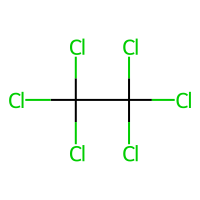
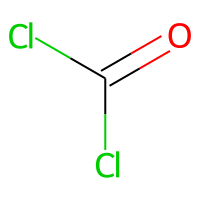
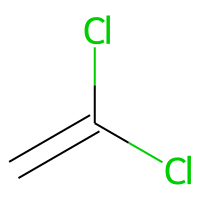
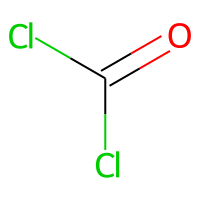
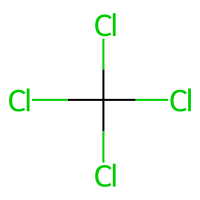
...
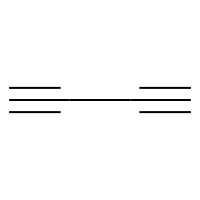
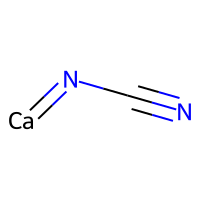
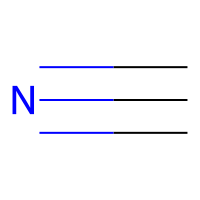
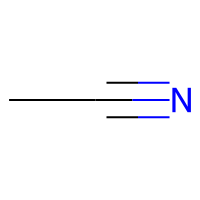
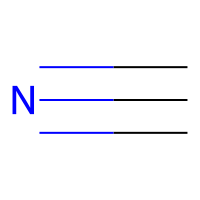

In [92]:
# display HTML
HTML(fpc.to_html())

In [93]:
# save to HTML
with open('../Similar_molecules/topsimilar_FPC.html','w') as f:
    f.write(fpc.to_html())

#### Molecular descriptors space

In [121]:
# load computed similar molecules
md = pd.read_csv('../Similar_molecules/topsimilar_MolDescEmbedding.tsv',sep='\t')
md.head()

,similar_cid,measure,type,model,orig_cid
0,10039,0.973859,inorganic,MolDescEmbedding,6371
1,19660,0.966078,inorganic,MolDescEmbedding,6371
2,25477,0.996121,inorganic,MolDescEmbedding,14781
3,11430,0.986604,inorganic,MolDescEmbedding,14781
4,10340,0.985148,inorganic,MolDescEmbedding,14781


In [95]:
# add isomeric SMILES to df
md['similar_SMILES'] = [getmol(cid) for cid in md['similar_cid']]
md['orig_SMILES'] = [getmol(cid) for cid in md['orig_cid']]

In [97]:
# add molecule structure figure
PandasTools.AddMoleculeColumnToFrame(md, smilesCol='similar_SMILES', molCol="similar_molecule")
PandasTools.AddMoleculeColumnToFrame(md, smilesCol='orig_SMILES', molCol="orig_molecule")

,similar_cid,measure,type,model,orig_cid,similar_SMILES,orig_SMILES,similar_molecule,orig_molecule
0,10039,0.973859,inorganic,MolDescEmbedding,6371,C(=O)=S,C(=O)(Cl)Cl,,
1,19660,0.966078,inorganic,MolDescEmbedding,6371,C(=O)([O-])[O-],C(=O)(Cl)Cl,,
2,25477,0.996121,inorganic,MolDescEmbedding,14781,O.O[Si]([O-])([O-])[O-].O[Si]([O-])([O-])[O-].[Mg+2].[Mg+2].[Mg+2],[OH-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[Ca+2].[Ca+2].[Ca+2].[Ca+2].[Ca+2],,
3,11430,0.986604,inorganic,MolDescEmbedding,14781,C(=O)([O-])[O-].[K+].[K+],[OH-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[Ca+2].[Ca+2].[Ca+2].[Ca+2].[Ca+2],,
4,10340,0.985148,inorganic,MolDescEmbedding,14781,C(=O)([O-])[O-].[Na+].[Na+],[OH-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[Ca+2].[Ca+2].[Ca+2].[Ca+2].[Ca+2],,
5,9989226,0.983914,inorganic,MolDescEmbedding,14781,[O-2].[O-2].[O-2].[Al+3].[Al+3],[OH-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[O-]P(=O)([O-])[O-].[Ca+2].[Ca+2].[Ca+2].[Ca+2].[Ca+2],,
6,24682,0.993389,inorganic,MolDescEmbedding,1119,O=S(=O)=O,O=S=O,,
7,24261,0.983729,inorganic,MolDescEmbedding,1119,O=[Si]=O,O=S=O,,
8,946,0.982451,inorganic,MolDescEmbedding,1119,N(=O)[O-],O=S=O,,
9,1117,0.981518,inorganic,MolDescEmbedding,1119,[O-]S(=O)(=O)[O-],O=S=O,,

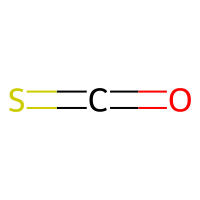
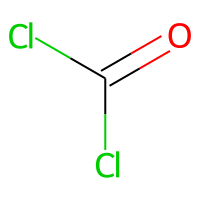
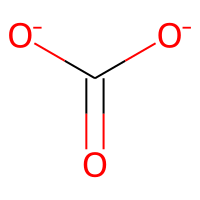
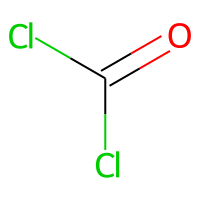
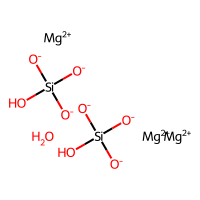
...
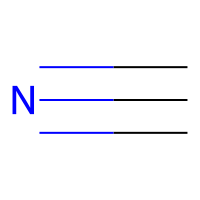
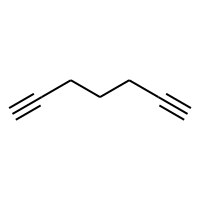
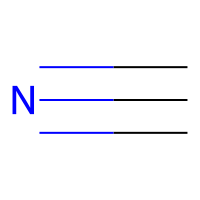
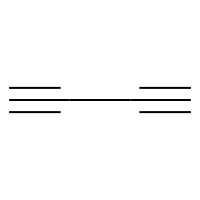
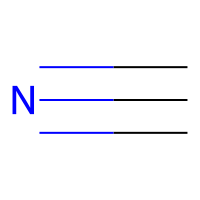

In [98]:
# display HTML
HTML(md.to_html())

In [99]:
# save to HTML
with open('../Similar_molecules/topsimilar_MD.html','w') as f:
    f.write(md.to_html())

##### Analyse single elements

In [102]:
# load computed similar molecules
md_elem = pd.read_csv('../Similar_molecules/topsimilar_MolDescElemEmbedding.tsv',sep='\t')
md_elem.head()

,similar_cid,measure,type,model,orig_cid
0,24408,0.989484,inorganic,MolDescElemEmbedding,24526
1,23986,0.948026,inorganic,MolDescElemEmbedding,5352425
2,23964,0.932867,inorganic,MolDescElemEmbedding,5352425
3,23948,0.932471,inorganic,MolDescElemEmbedding,5352425
4,23992,0.932195,inorganic,MolDescElemEmbedding,5352425


In [103]:
# add isomeric SMILES to df
md_elem['similar_SMILES'] = [getmol(cid) for cid in md_elem['similar_cid']]
md_elem['orig_SMILES'] = [getmol(cid) for cid in md_elem['orig_cid']]

In [104]:
# add molecule structure figure
PandasTools.AddMoleculeColumnToFrame(md_elem, smilesCol='similar_SMILES', molCol="similar_molecule")
PandasTools.AddMoleculeColumnToFrame(md_elem, smilesCol='orig_SMILES', molCol="orig_molecule")

[11:29:10] unsupported number of radical electrons 4
[11:29:10] unsupported number of radical electrons 4
[11:29:10] unsupported number of radical electrons 4
[11:29:10] unsupported number of radical electrons 4
[11:29:10] unsupported number of radical electrons 4


,similar_cid,measure,type,model,orig_cid,similar_SMILES,orig_SMILES,similar_molecule,orig_molecule
0,24408,0.989484,inorganic,MolDescElemEmbedding,24526,BrBr,ClCl,,
1,23986,0.948026,inorganic,MolDescElemEmbedding,5352425,[Hf],[Pb],,
2,23964,0.932867,inorganic,MolDescElemEmbedding,5352425,[W],[Pb],,
3,23948,0.932471,inorganic,MolDescElemEmbedding,5352425,[Rh],[Pb],,
4,23992,0.932195,inorganic,MolDescElemEmbedding,5352425,[Yb],[Pb],,
5,23958,0.931242,inorganic,MolDescElemEmbedding,5352425,[Tb],[Pb],,
6,5462311,0.966352,inorganic,MolDescElemEmbedding,6327182,[B],[Te],,
7,5360835,0.962809,inorganic,MolDescElemEmbedding,6327182,[Ga],[Te],,
8,23938,0.940574,inorganic,MolDescElemEmbedding,935,[Pd],[Ni],,
9,23973,0.938778,inorganic,MolDescElemEmbedding,935,[Cd],[Ni],,

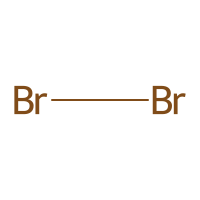
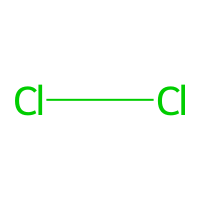
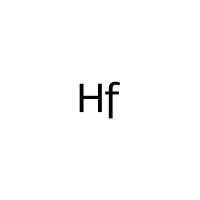
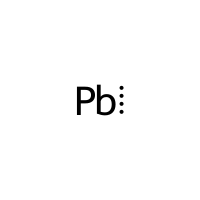
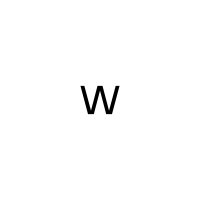
...
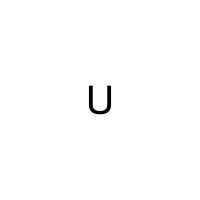
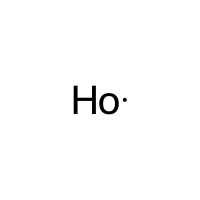
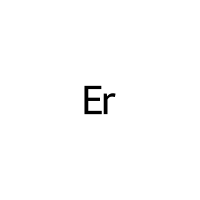
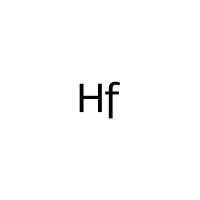
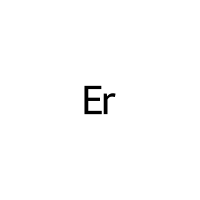

In [105]:
# display HTML
HTML(md_elem.to_html())

In [106]:
# save to HTML
with open('../Similar_molecules/topsimilar_MD_elem.html','w') as f:
    f.write(md_elem.to_html())

[11:29:15] unsupported number of radical electrons 4
[11:29:15] unsupported number of radical electrons 4
[11:29:15] unsupported number of radical electrons 4
[11:29:15] unsupported number of radical electrons 4
[11:29:15] unsupported number of radical electrons 4


##### Quantum properties space

In [122]:
# load computed similar molecules
qp = pd.read_csv('../Similar_molecules/topsimilar_QuantumPropsEmbedding.tsv',sep='\t')
qp.head()

,similar_cid,measure,type,model,orig_cid
0,6348,0.995993,inorganic,QuantumPropsEmbedding,6371
1,10039,0.989647,inorganic,QuantumPropsEmbedding,6371
2,2365,0.977734,inorganic,QuantumPropsEmbedding,6371
3,31373,0.966564,inorganic,QuantumPropsEmbedding,6371
4,6391,0.966119,inorganic,QuantumPropsEmbedding,6371


In [109]:
# add SMILES to df
qp['similar_SMILES'] = [getmol(cid) for cid in qp['similar_cid']]
qp['orig_SMILES'] = [getmol(cid) for cid in qp['orig_cid']]

In [110]:
# add molecule structure figure
PandasTools.AddMoleculeColumnToFrame(qp, smilesCol='similar_SMILES', molCol="similar_molecule")
PandasTools.AddMoleculeColumnToFrame(qp, smilesCol='orig_SMILES', molCol="orig_molecule")

,similar_cid,measure,type,model,orig_cid,similar_SMILES,orig_SMILES,similar_molecule,orig_molecule
0,6348,0.995993,inorganic,QuantumPropsEmbedding,6371,C(=S)=S,C(=O)(Cl)Cl,,
1,10039,0.989647,inorganic,QuantumPropsEmbedding,6371,C(=O)=S,C(=O)(Cl)Cl,,
2,2365,0.977734,inorganic,QuantumPropsEmbedding,6371,C1COC1=O,C(=O)(Cl)Cl,,
3,31373,0.966564,inorganic,QuantumPropsEmbedding,6371,C(=C(Cl)Cl)(Cl)Cl,C(=O)(Cl)Cl,,
4,6391,0.966119,inorganic,QuantumPropsEmbedding,6371,C(F)(F)(Cl)Cl,C(=O)(Cl)Cl,,
5,6431,0.965737,inorganic,QuantumPropsEmbedding,6371,C(C(F)(F)F)(F)(F)F,C(=O)(Cl)Cl,,
6,6389,0.963706,inorganic,QuantumPropsEmbedding,6371,C(F)(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
7,6423,0.963671,inorganic,QuantumPropsEmbedding,6371,C([N+](=O)[O-])(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
8,6323,0.960698,inorganic,QuantumPropsEmbedding,6371,CBr,C(=O)(Cl)Cl,,
9,6392,0.960290,inorganic,QuantumPropsEmbedding,6371,C(F)(F)(F)Cl,C(=O)(Cl)Cl,,

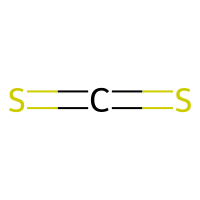
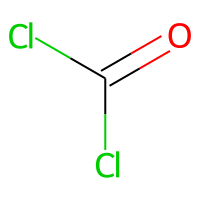
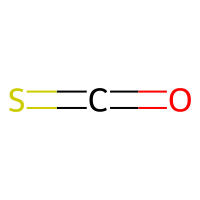
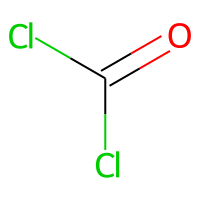
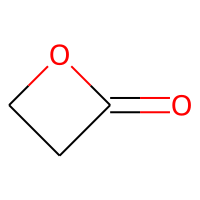
...
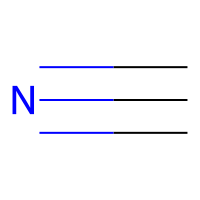
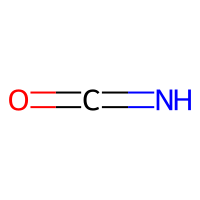
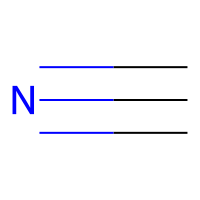
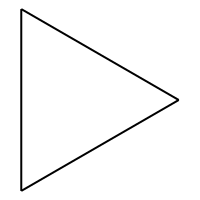
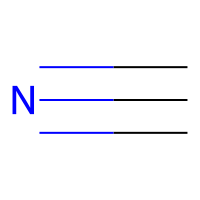

In [111]:
# display HTML
HTML(qp.to_html())

In [112]:
# save to HTML
with open('../Similar_molecules/topsimilar_QP.html','w') as f:
    f.write(qp.to_html())

##### Analyse single elements

In [113]:
# load computed similar molecules
qp_elem = pd.read_csv('../Similar_molecules/topsimilar_QuantumPropsElemEmbedding.tsv',sep='\t')
qp_elem.head()

,similar_cid,measure,type,model,orig_cid
0,24524,0.989267,inorganic,QuantumPropsElemEmbedding,24526
1,23960,0.992708,inorganic,QuantumPropsElemEmbedding,5352425
2,23989,0.991796,inorganic,QuantumPropsElemEmbedding,5352425
3,23964,0.991338,inorganic,QuantumPropsElemEmbedding,5352425
4,5354495,0.989704,inorganic,QuantumPropsElemEmbedding,5352425


In [114]:
# add isomeric SMILES to df
qp_elem['similar_SMILES'] = [getmol(cid) for cid in qp_elem['similar_cid']]
qp_elem['orig_SMILES'] = [getmol(cid) for cid in qp_elem['orig_cid']]

In [115]:
# add molecule structure figure
PandasTools.AddMoleculeColumnToFrame(qp_elem, smilesCol='similar_SMILES', molCol="similar_molecule")
PandasTools.AddMoleculeColumnToFrame(qp_elem, smilesCol='orig_SMILES', molCol="orig_molecule")

[11:47:55] unsupported number of radical electrons 4
[11:47:55] unsupported number of radical electrons 4
[11:47:55] unsupported number of radical electrons 4
[11:47:55] unsupported number of radical electrons 4
[11:47:55] unsupported number of radical electrons 4
[11:47:55] unsupported number of radical electrons 4
[11:47:55] unsupported number of radical electrons 4
[11:47:55] unsupported number of radical electrons 4
[11:47:55] unsupported number of radical electrons 4
[11:47:55] unsupported number of radical electrons 4
[11:47:55] unsupported number of radical electrons 4


,similar_cid,measure,type,model,orig_cid,similar_SMILES,orig_SMILES,similar_molecule,orig_molecule
0,24524,0.989267,inorganic,QuantumPropsElemEmbedding,24526,FF,ClCl,,
1,23960,0.992708,inorganic,QuantumPropsElemEmbedding,5352425,[Th],[Pb],,
2,23989,0.991796,inorganic,QuantumPropsElemEmbedding,5352425,[U],[Pb],,
3,23964,0.991338,inorganic,QuantumPropsElemEmbedding,5352425,[W],[Pb],,
4,5354495,0.989704,inorganic,QuantumPropsElemEmbedding,5352425,[Sb],[Pb],,
5,5359967,0.989646,inorganic,QuantumPropsElemEmbedding,5352425,[In],[Pb],,
6,5354618,0.985678,inorganic,QuantumPropsElemEmbedding,5352425,[Cs],[Pb],,
7,23926,0.982454,inorganic,QuantumPropsElemEmbedding,5352425,[La],[Pb],,
8,5359367,0.981432,inorganic,QuantumPropsElemEmbedding,5352425,[Bi],[Pb],,
9,5355457,0.994758,inorganic,QuantumPropsElemEmbedding,6327182,[Ba],[Te],,

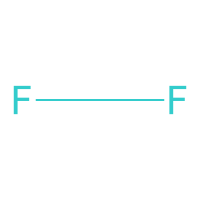
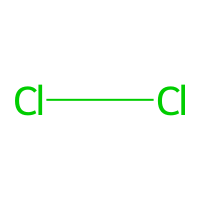
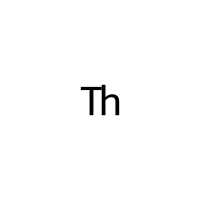
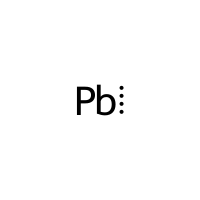
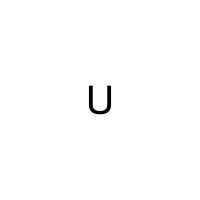
...
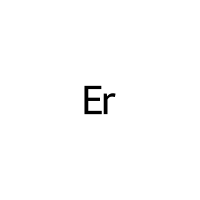
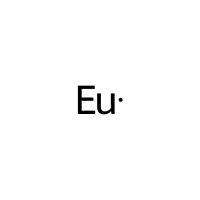
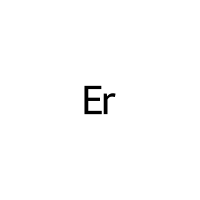
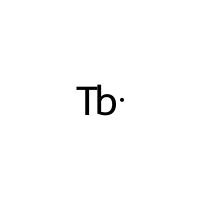
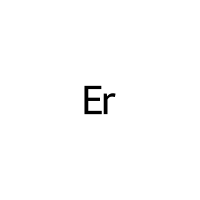

In [116]:
# display HTML
HTML(qp_elem.to_html())

In [117]:
# save to HTML
with open('../Similar_molecules/topsimilar_QP_elem.html','w') as f:
    f.write(qp_elem.to_html())

[11:48:02] unsupported number of radical electrons 4
[11:48:02] unsupported number of radical electrons 4
[11:48:02] unsupported number of radical electrons 4
[11:48:02] unsupported number of radical electrons 4
[11:48:02] unsupported number of radical electrons 4
[11:48:02] unsupported number of radical electrons 4
[11:48:02] unsupported number of radical electrons 4
[11:48:02] unsupported number of radical electrons 4
[11:48:02] unsupported number of radical electrons 4
[11:48:02] unsupported number of radical electrons 4
[11:48:02] unsupported number of radical electrons 4


##### Case studies
| CID | Chemical_Name | Molecule_Type
| --- | --- | --- |
| 6371 | Phosgene | inorganic 
| 14781 | Hydroxyapatite | inorganic
| 32881 | 2-(2-Hydroxypropoxy)propan-1-ol | organic
| 70155 | 1-Methyl-4-nitronaphthalene | organic

In [204]:
# subset case studies
cid_cs = [6371, 14781, 32881, 70155]

# FPB
fpb_cs = fpb[fpb['orig_cid'].isin(cid_cs)]
# FPC
fpc_cs = fpc[fpc['orig_cid'].isin(cid_cs)]
# MD
md_cs = md[md['orig_cid'].isin(cid_cs)]
# QP
qp_cs = qp[qp['orig_cid'].isin(cid_cs)]

# output dataframe
df_cs = pd.concat([fpb_cs, fpc_cs, md_cs, qp_cs])
df_cs

,similar_cid,measure,type,model,orig_cid
0,5943,0.989065,inorganic,FPBitsEmbedding,6371
1,6212,0.988467,inorganic,FPBitsEmbedding,6371
2,6278,0.982443,inorganic,FPBitsEmbedding,6371
3,6214,0.975656,inorganic,FPBitsEmbedding,6371
4,6344,0.967288,inorganic,FPBitsEmbedding,6371
...,...,...,...,...,...
172,7681,0.985910,organic,QuantumPropsEmbedding,70155
173,11769,0.981713,organic,QuantumPropsEmbedding,70155
174,11767,0.977628,organic,QuantumPropsEmbedding,70155
175,17151,0.977286,organic,QuantumPropsEmbedding,70155


In [206]:
# sort similar molecules
sort_df = pd.DataFrame()
for cid in cid_cs:
    
    # compute average similarity and counts for each similar molecule
    tmp_df = df_cs[df_cs.orig_cid.isin([cid])]
    sim_freq = pd.DataFrame(tmp_df.groupby('similar_cid')['measure'].mean())
    sim_freq['freq'] = tmp_df.groupby('similar_cid')['similar_cid'].count()

    # merge dataframes and sort by frequency and average similarity
    sim_freq = pd.merge(tmp_df, sim_freq, left_on='similar_cid', right_on='similar_cid', how='right')
    sim_freq.sort_values(by=['orig_cid', 'freq', 'measure_y'], ascending=[True, False, False], inplace=True)

    # create output dataframe
    sort_df = pd.concat([sort_df, sim_freq])

sort_df.reset_index(drop=True, inplace=True)
sort_df

,similar_cid,measure_x,type,model,orig_cid,measure_y,freq
0,10039,0.973859,inorganic,MolDescEmbedding,6371,0.981753,2
1,10039,0.989647,inorganic,QuantumPropsEmbedding,6371,0.981753,2
2,5943,0.989065,inorganic,FPBitsEmbedding,6371,0.981088,2
3,5943,0.973111,inorganic,FPCountsEmbedding,6371,0.981088,2
4,6212,0.988467,inorganic,FPBitsEmbedding,6371,0.977521,2
...,...,...,...,...,...,...,...
217,97240,0.966312,organic,FPBitsEmbedding,70155,0.966312,1
218,16450,0.966137,organic,FPBitsEmbedding,70155,0.966137,1
219,11392,0.965798,organic,FPBitsEmbedding,70155,0.965798,1
220,11818,0.962443,organic,FPBitsEmbedding,70155,0.962443,1


In [207]:
# add isomeric SMILES to df
sort_df['similar_SMILES'] = [getmol(cid) for cid in sort_df['similar_cid']]
sort_df['orig_SMILES'] = [getmol(cid) for cid in sort_df['orig_cid']]

In [208]:
# add molecule structure figure
PandasTools.AddMoleculeColumnToFrame(sort_df, smilesCol='similar_SMILES', molCol="similar_molecule")
PandasTools.AddMoleculeColumnToFrame(sort_df, smilesCol='orig_SMILES', molCol="orig_molecule")

,similar_cid,measure_x,type,model,orig_cid,measure_y,freq,similar_SMILES,orig_SMILES,similar_molecule,orig_molecule
0,10039,0.973859,inorganic,MolDescEmbedding,6371,0.981753,2,C(=O)=S,C(=O)(Cl)Cl,,
1,10039,0.989647,inorganic,QuantumPropsEmbedding,6371,0.981753,2,C(=O)=S,C(=O)(Cl)Cl,,
2,5943,0.989065,inorganic,FPBitsEmbedding,6371,0.981088,2,C(Cl)(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
3,5943,0.973111,inorganic,FPCountsEmbedding,6371,0.981088,2,C(Cl)(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
4,6212,0.988467,inorganic,FPBitsEmbedding,6371,0.977521,2,C(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
5,6212,0.966576,inorganic,FPCountsEmbedding,6371,0.977521,2,C(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
6,6214,0.975656,inorganic,FPBitsEmbedding,6371,0.977127,2,C(C(Cl)(Cl)Cl)(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
7,6214,0.978598,inorganic,FPCountsEmbedding,6371,0.977127,2,C(C(Cl)(Cl)Cl)(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
8,6278,0.982443,inorganic,FPBitsEmbedding,6371,0.976656,2,CC(Cl)(Cl)Cl,C(=O)(Cl)Cl,,
9,6278,0.970868,inorganic,FPCountsEmbedding,6371,0.976656,2,CC(Cl)(Cl)Cl,C(=O)(Cl)Cl,,

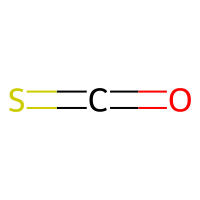
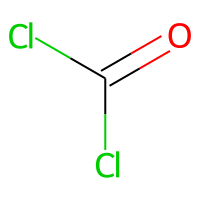
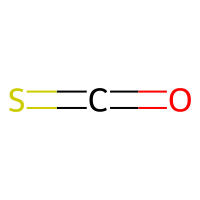
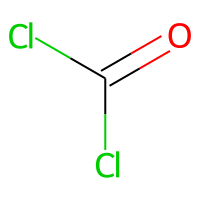
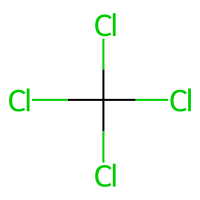
...
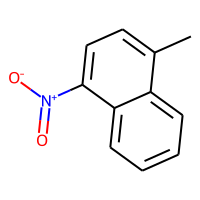
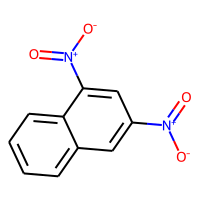
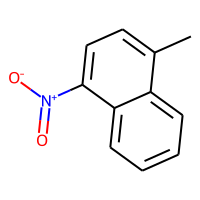
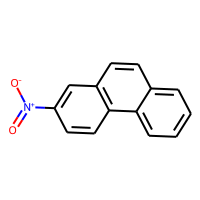
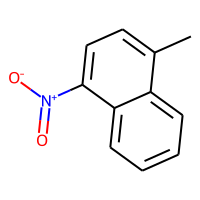

In [209]:
# display HTML
HTML(sort_df.to_html())

In [305]:
# save to HTML
with open('../Similar_molecules/case_studies.html','w') as f:
    f.write(sort_df.to_html())